# EXAMINING THE CORRELATION BETWEEN RCSD AND RCAP
# Exploratory Data Analysis

* Author: Jared Coffey
* Project Dates: (5/18/2022 - 11/22/2022)
* Datasets used: 

Abstract: 

The Rochester City SChool District (RCSD) is known for being one of the poorest in the nation. 



Racially Concentrated Areas of Poverty (RCAP) is a measure of how

**Who:** Jared Coffey

**When:** 5/18/2022

**What:** Exploratory Data Analysis of RCSD and Poverty in Rochester

**Where:** The City of Rochester, NY

**How?**
*   We will map plot schools within the city limits and their surrounding areas
*   We will map plot the highest racial, c and poverty areas within rochester
*   We will observe our findings and any overlay that may occur using the 

# **Import Data**

In [ ]:
# INSTALL NECESSARY DEPENDENCIES
!pip install plotly
!pip install pyodbc
!pip install geopandas
!pip install pyshp

# note: comment out as unneccesary

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 324 kB 4.9 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 5.0 MB/s 
     |████████████████████████████████| 16.7 MB 769 kB/s 
     |████████████████████████████████| 6.3 MB 41.0 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 46 kB 2.4 MB/s 


In [ ]:
# D.S. LIBS
import numpy as np
import pandas as pd

# GEOLOCATION LIBS
import geopandas as gpd
from geopandas import GeoDataFrame

#OS LIBS
import os
from os.path import join

# PLOT LIBS
import matplotlib.pyplot as plt
from shapely.geometry import Point 

import plotly.express as px 
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pyodbc 

# FILEIO
import shapefile

# MOUNT GOOGLE DRIVE + LIBS
from google.colab import drive 
drive.mount('/content/gdrive')
# note: only need to do this every time you start a session

Mounted at /content/gdrive


In [ ]:
loc_path = "gdrive/My Drive/Data_Projects/RCSD_ANALYSIS/data/location_data/"
pov_path = "gdrive/My Drive/Data_Projects/RCSD_ANALYSIS/data/pov/"

In [ ]:
# RCSD LOCATION DATA
file = os.path.join(loc_path, 'Rochester_City_School_District_(RCSD)_Schools_and_Programs.csv')
rcsd = pd.read_csv(file)
rcsd.head(3)

# TRIM THE FAT
rcsd = rcsd[['X','Y','Score','Match_type','USER_Name','USER_Type','USER_Addre']]

# EXTRACT ZIPCODE
rcsd['ZIP'] = rcsd['USER_Addre'].str.extract(r'(\d{5}\-?\d{0,4})')  # We must match '{5}' repetitions of '\d' = a numerical digit;

In [ ]:
# VISUALIZING A DATAFRAME
rcsd.head(5)
#rcsd

,X,Y,Score,Match_type,USER_Name,USER_Type,USER_Addre,ZIP
0,-77.625330,43.145250,100.0,A,02 - Clara Barton School,Elementary,"190 Reynolds Street, Rochester, NY 14608",14608
1,-77.630382,43.146963,100.0,A,04 - George Mather Forbes School,Elementary,"198 Dr. Samuel McCree Way, Rochester, NY 14611",14611
2,-77.624121,43.162544,100.0,A,05 - John Williams School,Elementary,"555 N. Plymouth Ave.,Rochester, NY 14608",14608
3,-77.637931,43.183940,100.0,A,07 - Virgil I. Grissom School,Elementary,"31 Bryan St., Rochester, NY 14613",14613
4,-77.624323,43.176944,100.0,A,08 - Roberto Clemente School,Elementary,"1180 St. Paul St., Rochester, NY 14621",14621


In [ ]:
# CLEANING 
rcsd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   X           54 non-null     float64
 1   Y           54 non-null     float64
 2   Score       54 non-null     float64
 3   Match_type  54 non-null     object 
 4   USER_Name   54 non-null     object 
 5   USER_Type   54 non-null     object 
 6   USER_Addre  54 non-null     object 
 7   ZIP         54 non-null     object 
dtypes: float64(3), object(5)
memory usage: 3.5+ KB


*Key Takeaways:*

* No Missing Data in our datasets
* We should probably convert our "Object" Datatype Variables into Strings if we need to directly work with them
* Let's keep an eye on "Zipcode" as a key parameter (We separated that into its own column)

In [ ]:
# BASIC ANALYSIS FOR TRENDS

# FIND MODES OF APPLICABLE ATTRIBUTES
zip = rcsd.ZIP.mode()
level = rcsd.USER_Type.mode()
score = rcsd.Score.mode()
match = rcsd.Match_type.mode()

modes = pd.DataFrame(data={'zip':zip,
                          'school level':level,
                          'school score':score,
                          'match type':match})

modes.style.set_caption("MODE AVERAGE FOR RCSD DATA")

,zip,school level,school score,match type
0,14605,Elementary,100.000000,A


From this, we can see that the "average" school in the Rochester City School District is an elementary school with a school score of 100, a match type of "A", and located in the zip code 14605.

In [ ]:
schools_fig = px.scatter_mapbox(
                        rcsd,
                        lat = rcsd['Y'],
                        lon = rcsd['X'],
                        color=None,
                        text='USER_Name',
                        hover_name = rcsd['USER_Name'],
                        hover_data= rcsd[['USER_Addre']],
                        zoom = 10,
                        mapbox_style = 'open-street-map',
                        title='RCSD School Districts'
                        )
schools_fig.show()

NOW LET'S LOOK AT THE POVERTY DATA

In [ ]:
# ROCHESTER POVERTY DATA
border_file = os.path.join(loc_path, 'City_of_Rochester_Border.shp')
schools_file = os.path.join(loc_path, 'Rochester_City_School_District_(RCSD)_Schools_and_Programs.shp')
rcap_shp = os.path.join(pov_path, 'Racially_or_Ethnically_Concentrated_Areas_of_Poverty__R_ECAPs_.shp')
rcap_csv = os.path.join(pov_path, 'Racially_or_Ethnically_Concentrated_Areas_of_Poverty__R_ECAPs_.csv')
roc_border = gpd.read_file(border_file)
roc_schools = gpd.read_file(schools_file)


#NATIONAL POVERTY DATA
rcap = gpd.read_file(rcap_shp)                    
rcap.head()

,FID,GEOID,STATE,STUSAB,STATE_NAME,COUNTY,COUNTY_NAM,CNTY_FIPS,TRACT,RCAP_90,RCAP_00,RCAP_10,RCAP_Curre,SHAPE_Leng,SHAPE_Area,geometry
0,1,15003008613,15,HI,Hawaii,003,Honolulu,15003,008613,0.0,0.0,0.0,0.0,0.026865,0.000025,"POLYGON ((-158.08805 21.35210, -158.08808 21.3..."
1,2,15003940002,15,HI,Hawaii,003,Honolulu,15003,940002,0.0,0.0,0.0,0.0,0.195958,0.001543,"POLYGON ((-158.10115 21.41354, -158.10104 21.4..."
2,3,15003008614,15,HI,Hawaii,003,Honolulu,15003,008614,0.0,0.0,0.0,0.0,0.454675,0.006573,"POLYGON ((-158.05700 21.48257, -158.05671 21.4..."
3,4,15003008611,15,HI,Hawaii,003,Honolulu,15003,008611,0.0,0.0,0.0,0.0,0.201856,0.001127,"POLYGON ((-158.09120 21.35420, -158.09121 21.3..."
4,5,15003008622,15,HI,Hawaii,003,Honolulu,15003,008622,0.0,0.0,0.0,0.0,0.074669,0.000222,"POLYGON ((-158.08836 21.35057, -158.08832 21.3..."


Note: We replot now using our modified and cleaned poverty data; thus, we cannot directly use our roc_pov data from above, but rather must do so manually by modifying the shapefile.

In [ ]:
rcap.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 73752 entries, 0 to 73751
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   FID         73752 non-null  int64   
 1   GEOID       73752 non-null  object  
 2   STATE       73752 non-null  object  
 3   STUSAB      73752 non-null  object  
 4   STATE_NAME  73752 non-null  object  
 5   COUNTY      73752 non-null  object  
 6   COUNTY_NAM  73752 non-null  object  
 7   CNTY_FIPS   73752 non-null  object  
 8   TRACT       73752 non-null  object  
 9   RCAP_90     73732 non-null  float64 
 10  RCAP_00     73732 non-null  float64 
 11  RCAP_10     73406 non-null  float64 
 12  RCAP_Curre  73732 non-null  float64 
 13  SHAPE_Leng  73752 non-null  float64 
 14  SHAPE_Area  73752 non-null  float64 
 15  geometry    73752 non-null  geometry
dtypes: float64(6), geometry(1), int64(1), object(8)
memory usage: 9.0+ MB


Notice that we there are some missing values in the "RCAP_00" category. To account for this, we'll first narrow down our search to just Rochester, and then take care of any null values.

Null values: we'll take a look at what they are, and then can estimate from there if possible.

Our goal is to essentially modify our poverty dataset to just Rochester, NY (as opposed to the entire U.S.). Based on this data, we are only really looking at:

* CNTY_FIPS: USNG Coordinate System to narrow down our area to Monroe County, NY.

* RCAP: Racially Concentrated Areas of Poverty, defined as a census tract area where more than 40% of residents have incomes less than the Federal poverty level and more than 50% of the residents on the aforementioned track are pole of color. We are given the RCAP levels for 1990, 2000, 2010, and 2020 ("Current as of the Data's Publishing).  

**KEY TAKEAWAYS:**

* There appears to be some null values in the 'RCAP_Current'; we should investigate and see if any of the null values are in our area of interest...

* 'CNTY_FIPS' is type "object", which we'll need to switch to either int or string. Since this essentially encapsulates Monroe County in NY, we may be able to get away with just using this criteria in order to scale down our shapefile.

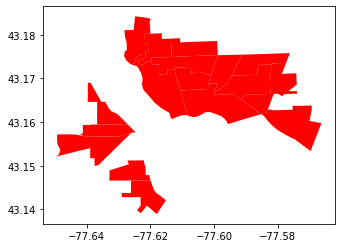

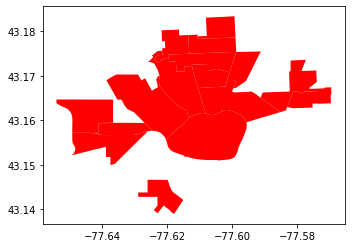

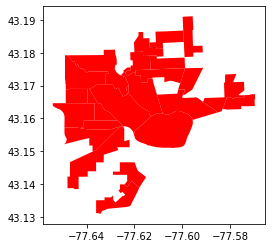

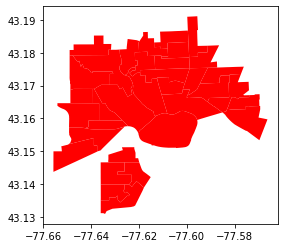

In [ ]:
# CONVERT 'COLUMNS INTO INTEGER DATATYPE 
rcap['CNTY_FIPS'] = rcap['CNTY_FIPS'].astype(int)
# rcap['RCAP_Curre'] = rcap['RCAP_Curre'].astype(boolean)

# NARROW DOWN BY 'AREA'
roc_pov = rcap[rcap['CNTY_FIPS']==36055]

# PLOT TO SEE OUR NEW DATA NARROWED DOWN
roc_pov[roc_pov['RCAP_90']==1].plot(color='red')
roc_pov[roc_pov['RCAP_00']==1].plot(color='red')
roc_pov[roc_pov['RCAP_10']==1].plot(color='red')
roc_pov[roc_pov['RCAP_Curre']==1].plot(color='red')


In [ ]:
# LET'S TAKE ANOTHER LOOK AT THAT POSSIBLE MISSING DATA

null_vals = roc_pov[roc_pov['RCAP_10'].isnull()]
null_vals

,FID,GEOID,STATE,STUSAB,STATE_NAME,COUNTY,COUNTY_NAM,CNTY_FIPS,TRACT,RCAP_90,RCAP_00,RCAP_10,RCAP_Curre,SHAPE_Leng,SHAPE_Area,geometry
49345,49346,36055980000,36,NY,New York,055,Monroe,36055,980000,0.0,0.0,NaN,0.0,0.143353,0.000626,"POLYGON ((-77.64539 43.12322, -77.64549 43.123..."


To clean: 
We'll take the mode average of RCAP data from all other decades that have data given: 

We can see that RCAP levels all other decades are 0.0, so for this one value we'll fill it in with 0. 

We can generalize this process to take in the mode average and in turn place that as the value, but I'm frankly too lazy and there are more important matters at hand. 

In [ ]:
roc_pov['RCAP_10'].fillna(0)
roc_pov[roc_pov['RCAP_10'].isnull()]  # should be none

,FID,GEOID,STATE,STUSAB,STATE_NAME,COUNTY,COUNTY_NAM,CNTY_FIPS,TRACT,RCAP_90,RCAP_00,RCAP_10,RCAP_Curre,SHAPE_Leng,SHAPE_Area,geometry
49345,49346,36055980000,36,NY,New York,055,Monroe,36055,980000,0.0,0.0,NaN,0.0,0.143353,0.000626,"POLYGON ((-77.64539 43.12322, -77.64549 43.123..."


In [ ]:
# PREPROCESS COORDINATE DATA

# RCAP DATA
roc_pov = roc_pov.to_crs('WGS84') # convert to lat/lon coords.
roc_pov['RCAP_Curre'] = roc_pov['RCAP_Curre'].astype(str) # convert numeric data to 
roc_pov['RCAP_10'] = roc_pov['RCAP_10'].astype(str) # strings to compute discrete
roc_pov['RCAP_00'] = roc_pov['RCAP_00'].astype(str) # data for our figure
roc_pov['RCAP_90'] = roc_pov['RCAP_90'].astype(str)

rcap = roc_pov[['RCAP_Curre','RCAP_10','RCAP_00','RCAP_90','GEOID', 'geometry']]

In [ ]:
# RCAP 1990s PLOT
fig90 = px.choropleth_mapbox(
            data_frame = rcap,
            geojson=rcap.geometry,
            locations=rcap.index,
            hover_data=rcap[['GEOID']],
            color="RCAP_90",
            center = dict(lat=43.1566, lon=-77.6088),
            mapbox_style="open-street-map", 
            zoom=11,
            labels = {'RCAP_90': "RCAP Levels 1990s"},
            title='1990s RCAP Levels',
            opacity=0.3,
            range_color=(0,1),
            color_discrete_map = {"0.0": "LightGreen"},
            width = 1000,
            height = 500         
      )

# RCAP 2000s PLOT
fig00 = px.choropleth_mapbox(
            data_frame = rcap,
            geojson=rcap.geometry,
            locations=rcap.index,
            hover_data=rcap[['GEOID']],
            color="RCAP_00",
            center = dict(lat=43.1566, lon=-77.6088),
            mapbox_style="open-street-map", 
            zoom=11,
            labels = {'RCAP_00': "RCAP Levels 2000s"},
            title='2000 RCAP Levels',
            opacity=0.3,
            range_color=(0,1),        
            color_discrete_map = {"0.0": "LightGreen"},
            width = 1000,
            height = 500         
      )

# RCAP 2010s PLOT
fig10 = px.choropleth_mapbox(
            data_frame = rcap,
            geojson=rcap.geometry,
            locations=rcap.index,
            hover_data=rcap[['GEOID']],
            color="RCAP_10",
            center = dict(lat=43.1566, lon=-77.6088),
            mapbox_style="open-street-map", 
            zoom=11,
            labels = {'RCAP_10': "RCAP Level 2010s"},
            title='2010s RCAP Levels',
            opacity=0.3,
            range_color=(0,1),        
            color_discrete_map = {"0.0": "LightGreen"},
            width = 1000,
            height = 500         
      )

# RCAP 2020s PLOT
fig20 = px.choropleth_mapbox(
            data_frame = rcap,
            geojson=rcap.geometry,
            locations=rcap.index,
            hover_data=rcap[['GEOID']],
            color="RCAP_Curre",
            center = dict(lat=43.1566, lon=-77.6088),
            mapbox_style="open-street-map", 
            zoom=11,
            labels = {'RCAP_Curre': "RCAP Levels 2020s to present (end of 2022)"},
            title='2020 RCAP Levels',
            opacity=0.3,
            range_color=(0,1),        
            color_discrete_map = {"0.0": "LightGreen"},
            width = 1000,
            height = 500         
      )


# UPDATE LAYOUTS
fig00.update(layout_coloraxis_showscale=True)
fig90.update(layout_coloraxis_showscale=True)
fig10.update(layout_coloraxis_showscale=True)
fig20.update(layout_coloraxis_showscale=True)

# SHOW PLOTS
fig90.show()
fig00.show()
fig10.show()
fig20.show()

In [ ]:
# CURRENT PLOT
fig_Current=px.choropleth_mapbox(
            data_frame = roc_pov,
            geojson=roc_pov.geometry,
            locations=roc_pov.index,
            hover_data=roc_pov[['GEOID']],
            color="RCAP_Curre",
            center = dict(lat=43.1566, lon=-77.6088),
            mapbox_style="open-street-map", 
            zoom=11,
            labels = {'RCAP_Curre': "RCAP Levels 2020s to present (end of 2022)"},
            title='2020 RCAP Levels',
            opacity=0.6,
            range_color=(0,1),        
            color_discrete_map = {"0.0": "LightGreen"},
            width = 1000,
            height = 500         
      )


# ADD SCHOOL DATA LAST (IMPORTANT)
fig_Current.add_trace(
    px.scatter_mapbox(
            data_frame = rcsd,
            lat = rcsd['Y'],
            lon = rcsd['X'],
            hover_name = rcsd['USER_Name'],
            hover_data = rcsd[['USER_Addre']],
            zoom = 11,  
      )
.data[0])


# UPDATE LAYOUT
fig_Current.update(layout_coloraxis_showscale=False)
fig_Current.update_layout(showlegend=True)
fig_Current.update_layout(title = "RCSD/RCAP Current Analysis")
fig_Current.update_layout(
    legend = dict(
      title_font_family="Times New Roman",
      font=dict(
          family ="Times New Roman",
          size = 14,
          color = "black"
      ),
      bgcolor = "LightGray",
      bordercolor = "Black",
      borderwidth = 3
    )
  )

# Conclusions: